# Analyse territorialisé des interventions volontaires de grosssesse : les disparités d'accès en France

*Par Aika Mizuno Greer et Polixène Grésant, 2025.*

## Introduction <a name="intro"></a>

En 2024, la liberté de recourir à une IVG est inscrite dans la Constitution française pour la première fois. Cette liberté est désormais protégée juridiquement. Néanmois, les difficultés pratiques auxquelles sont confrontées les personnes souhaitant avorter révèlent des inégalités devant un théorique droit à avorter, indépendemment de la liberté érigée récemment. Des inégalités d'accès persistent sur le territoire français. 

Nous cherchons ainsi à établir une classification des départements en fonction de comment se déroule les IVGs et à leur recours. L'objectif est d'établir une typologie, afin de décrire plus précisèment les différences d'accès à l'IVG selon les départements en France.
Dans cette logique, afin d'expliquer les différences de recours au sein d'un département, nous souhaitons tester si le nombre d'IVGs est explicable notamment selon les délais d'attente. 

**Source** : L'accès à l'avortement dans l'Union européenne, Science Po, 2024 : https://www.sciencespo.fr/gender-studies/fr/actualites/acces-a-l-ivg-des-inegalites-persistantes-en-europe/

## Sommaire
- [Introduction](#intro)
- 1. [Environnement Python](#install)
- 2. [Importation et nettoyage des données](#donnees)
    - 2.1. [Open Data](#openData)
        - 2.1.1. [DREES](#DREES)
        - 2.1.2. [SAE](#SAE)
        - 2.1.3. [FINESS](#FINESS)
        - 2.1.4. [INSEE](#INSEE)
    - 2.2. [Web Scraping](#web)
    - 2.3. [Jointure, normalisation et récapitulatif des variables](#jointure)
- 3. [Visualisation et traitements statistiques](#visu)
    - 3.1. [Échelle nationale](#nationale)
    - 3.2. [Échelle départementale](#dep)
    - 3.3. [Corrélations entre variables](#corr)
- 4. [Classification des départements français](#classe)
    - 4.1. [Répartition spatiale des classes](#repartition)
    - 4.2. [Statistiques selon la classe](#statsClasse)
    - 4.3. [Lien avec le taux de pauvreté](#lienPauv)
    - 4.4. [Prédiction de la classe avec le taux de pauvreté](#logit)
- [Conclusion](#ccl)

## 1 - Environnement Python <a name="install"></a>

> [!CAUTION]
> Nous recommandons d'ouvrir ce [notebook sur nbviewer](https://nbviewer.org/github/pgresant/PythonS1/blob/main/main.ipynb) pour assurer une bonne affichage des graphiques.
> Github ne permet pas l'affichage des graphes intéractives dans un notebook Jupyter. 

Pour compiler ce projet, plusieurs librairies sont nécessaires. Pour la collecte de données, des librairies comme `py7zr`, `xlrd` et `openpyxl` permettre d'ouvrir les sources tabulaires sous formats variés, notamment les excels. `Playwright` est utilisé lors du scrapping, mais une version locale des données est disponible. Les librairies de visualisation et de statistique sont nécessaires pour l'utilisation le notebook : `geopandas`, `plotly`, `folium`, `seaborn`, `statmodels`, `scipy`...

In [ ]:
%%capture --no-display

# Librairies pour l'importation des données
# ! pip install pandas py7xr xlrd openpyxl

# Librairies utilisées pour compiler les données
# ! pip install pandas geopandas scipy matplotlib

# Librairies et setup pour effectuer le scrapping
# ! pip install pytest-playwright playwright_stealth asyncio
# ! sudo playwright install-deps
# ! playwright install

# Librairies pour les statistiques
# ! pip install statmodels scipy

# Librairies pour la visualisation
# ! pip install mapclssify folium seaborn

## 2 - Importation et nettoyage des données <a name="donnees"></a>

Pour construire notre base de données d'étude sur l'accessibilité des IVGs en France, nous importons et nettoyons des variables de plusieurs sources. Trois scripts sont utilisées :
- `importation_donnees_tabulaires.py` pour les fonctions concernant le téléchargement et nettoyage des sources de données en open data
- `scraping_doctolib.py` pour le web-scraping de Doctolib
- `compilation_donnees.py` pour la création de variables ou d'agrégations (que ce soit spatiale ou par groupe) à partir des sources précédentes, et la jointure finale des données.

Pour toutes les sources, les détails du nettoyage et de la standardisation sont décrites dans les commentaires des scripts. Les commentaires de ce notebook ne sont pas exaustifs.

> [!NOTE]
> Étant donné que le téléchargement de données peut s'avérer long, une version locale des données est utilisée dans ce notebook. 
> Cette sauvegarde se trouve dans le dossier `./donnees/`, créée avec la fonction `sauvegarder_tout()` du fichier de compilation des données. 
> L'importation des CSVs de la sauvegarde se fait avec la fonction `importer_locale(date)` (la date de la sauvegarde étant utilisée dans les noms des fichiers).

In [1]:
## Importer les données tabulaires depuis les APIs Open Data
# from scripts.importation_donnees_tabuaires import *
# df_SAE, df_dep, df_finess, df_drees, df_pauv = importer_tout() 

## Importer une sauvegarde locale récente des données
from scripts.compilation_donnees import *
df_SAE, df_dep, df_finess, df_drees, df_pauv, df_doctolib = importer_locale("2025-12-16-17-35", "2025-11-20-14-56")

### 2.1 - Open Data <a name="openData"></a>
#### 2.1.1 - DREES  <a name="DREES"></a>
Les données de la DREES produites concernant les IVG sont indispensables à notre projet. Elles permettent d’avoir l’ensemble des statistiques par département concernant le recours à l’IVG entre 2016 et 2024, selon leur type, le praticien qui la réalise et l’âge de la personne y ayant recours. Ces données proviennent de remontées administratives et sont donc exhaustives.

Elles sont disponibles sur [data.gouv.fr](https://www.data.gouv.fr/datasets/ivg/) sous la forme de 8 CSVs séparés à joidre avec la clé (departement, annee). Nous retirons les lignes vides, nettoyons les colonnes (filtrage et renomage) pour améliorer la lisibilité. Les nombres à virgule sont convertis en float.

In [2]:
df_drees.head()

,ivg_hosp_ins,ivg_hosp_med,ivg_hosp_inc,ivg_cab,ivg_cen,tot_ivg,taux_rec,annee,ivg_inst,part_ivg_tard,...,age_35_39,age_sup_40,département,part_inf_18,part_18_19,part_20_24,part_25_29,part_30_34,part_35_39,part_sup_40
0,449.0,857.0,5.0,184.0,11.0,1506.0,10.817256,2016.0,214.0,5.7,...,225.0,124.0,Ain,0.037185,0.060425,0.229748,0.219788,0.221116,0.149402,0.082337
1,362.0,831.0,7.0,264.0,11.0,1475.0,10.578102,2017.0,149.0,4.5,...,242.0,99.0,Ain,0.027119,0.078644,0.224407,0.229831,0.208136,0.164068,0.067119
2,395.0,766.0,3.0,366.0,11.0,1541.0,11.063805,2018.0,154.0,4.5,...,249.0,112.0,Ain,0.024659,0.064893,0.240104,0.231668,0.204413,0.161583,0.072680
3,410.0,855.0,17.0,342.0,11.0,1635.0,11.726819,2019.0,172.0,5.0,...,269.0,125.0,Ain,0.031804,0.059939,0.230581,0.229969,0.206116,0.164526,0.076453
4,323.0,792.0,8.0,436.0,16.0,1575.0,11.294614,2020.0,179.0,4.1,...,286.0,136.0,Ain,0.031746,0.057778,0.197460,0.202540,0.240635,0.181587,0.086349


#### 2.1.2 - SAE <a name="SAE"></a>
Nous avons utilisé les données de la [Statistiques annuelles des établissements (SAE)](https://drees.solidarites-sante.gouv.fr/sources-outils-et-enquetes/00-la-statistique-annuelle-des-etablissements-sae) produites et publiées par la DREES, afin d’avoir accès aux données par établissement et donc pas uniquement par département. Cette base nous a permis de connaître le nombre d’établissements de santé réalisant des IVG, et si oui lesquelles (tardives, médicamenteuses, chirurgicales). Ce sont des informations indispensables pour établir  l’offre d’infrastructures qui peuvent réaliser des IVG dans chaque département. Ces données proviennent de remontées administratives et sont donc exhaustives.

La SAE possède plusieurs points d’accès, plus ou moins à jour, sur data.gouv.fr et le portail data de la DREES. Nous utilisons cette [version sur data.gouv.fr](https://www.data.gouv.fr/datasets/bases-statistiques-sae/) pour récupérer les données de 2024. Les données sont founies sous forme d'un 7Zip contenant plusieurs tables CSVs et leur documentation (disponible [ici](https://drees2-sgsocialgouv.opendatasoft.com/api/datasets/1.0/707_bases-administratives-sae/attachments/sae_2024_base_administrative_documentation_pdf/)). Des fichiers temporaires sont donc utilisées pour la gestion des dossiers zippés. Nous effectuons une jointure entre deux tables : PERINAT (périnatale) et ID (données administratives).





In [3]:
df_SAE.head()

,FI,PRIS,IVG,IVGN_1,IVGME,IVG1214,IVG1516,CONV,IMG,rs,stj,stjr,cat,catr,code_dep
0,010000024,1,498.0,513.0,319.0,41.0,21.0,NaN,14.0,CH DE FLEYRIAT,13,1,355,PUB2,01
1,010000032,1,77.0,87.0,45.0,2.0,1.0,1.0,0.0,CH BUGEY SUD,13,1,355,PUB2,01
2,010000065,1,64.0,73.0,64.0,0.0,0.0,NaN,0.0,CH DE TREVOUX - MONTPENSIER,13,1,355,PUB2,01
3,010005239,1,90.0,117.0,88.0,1.0,0.0,NaN,1.0,CH DU HAUT BUGEY - GEOVREISSET,14,1,355,PUB2,01
4,010780203,1,1.0,0.0,0.0,0.0,0.0,NaN,0.0,HOPITAL PRIVE D'AMBERIEU,95,2,365,PLU4,01


Les données sont agrégées à l'échelle départemente avec 3 comptages : 
- `pris` pour le nombre de conventions avec médecins pour IVG médicamenteuses
- `conv` pour le nombre d'établissement conventionnée à effectuer des IVGs
- `hopitaux_sans_ivg_tard` pour le nombre d'établissement ayant pris en charge au moins un IVG mais aucun IVG tardif

Effectivement, le nombre de centres de santé qui pratiquent des IVG mais qui ne pratique aucune IVG tardive en 2024 varie selon les départements. Cela témoigne d’un accès différencié selon les départements aux IVG tardives en particulier.

In [4]:
agregation_SAE(df_SAE).head()

,code_dep,PRIS,CONV,hopitaux_sans_ivg_tard
0,01,5,1.0,2.0
1,02,5,4.0,NaN
2,03,4,5.0,1.0
3,04,2,0.0,NaN
4,05,2,22.0,NaN


Depuis la refonte de 2014, la SAE ne fournit plus le délai de recours à une IVG dans les établissements. Nous avons regardé les données de 2013 dans le but de comparer l’accessibilité des IVGs aujourd’hui et de 2013. Cependant, sur les environ 570 établissements ayant effectué un IVG en 2013, plus de la moitié ne remontent pas cette variable sur le délai. Ainsi, faute de données incomplètes, nous n’utilisons pas cette piste. 

#### 2.1.3 - FINESS <a name="FINESS"></a>

Les données du [Fichier National des Etablissements Sanitaires et Sociaux (FINESS)](https://www.data.gouv.fr/datasets/finess-extraction-du-fichier-des-etablissements) permettent de compter le nombre de centres de santé sexuelle et de CEGIDD dans chaque département. Cela est utile afin de comprendre le niveau de développement de ce type d’infrastructures qui participent à la diffusion de connaissances concernant les IVG et la santé sexuelle. De plus, les centres de santé sexuelle réalisent des entretiens préalables aux IVG et des IVG médicamenteuses, c’est-à-dire avant 7 semaines de grossesse.  Ces données proviennent de remontées administratives et sont donc exhaustives.

In [5]:
agregation_finess(df_finess).head()

19,centre_de_sante_sexuelle,ceGIDD,centres_total
département,,,
AIN,1,2,3
AISNE,5,3,8
ALLIER,3,3,6
ALPES DE HAUTE PROVENCE,0,0,0
ALPES MARITIMES,8,1,9


#### 2.1.4 - INSEE <a name="INSEE"></a>
Les données de l’INSEE portant sur les départements ont été nécessaires pour connaître le nombre d’habitants par département, en particulier de femmes en âge de procréer, c'est-à-dire qui ont entre 15 et 49 ans par convention. **Il est important de comparer des données d’accessibilité relative et non absolues, car ce nombre varie fortement selon les départements.** Ce chiffre se calcule en sommant les tranches d'âges concernées dans les données 2025 des [estimations de la population](https://www.insee.fr/fr/statistiques/8331297). Le format tabulaires (xlsx) necessite un nettoyage des lignes et colonnes avant de créer le DataFrame.

In [29]:
df_dep.head()

,code_dep,département,femmes,DEP
0,01,Ain,289335,AIN
1,02,Aisne,207602,AISNE
2,03,Allier,117763,ALLIER
3,04,Alpes-de-Haute-Provence,59730,ALPES DE HAUTE PROVENCE
4,05,Hautes-Alpes,51076,HAUTES ALPES


Afin de mettre en perspective les données sur les IVG avec des données concernant les caractéristiques socio-démographiques, nous avons utilisé les données produites par l’INSEE sur les taux de pauvreté par département. Le but est de tester un potentiel lien entre le niveau de pauvreté des départements et le recours aux IVG, en considérant les infrastructures présentes sur le territoire. Disponible seulement jusqu'en 2011 [ici](https://www.insee.fr/fr/statistiques/1895072?sommaire=2390213), les données sont aussi en format xlsx.

In [30]:
df_pauv.head()

,code_dep,taux_pauvrete
0,01,10.8
1,02,18.8
2,03,16.2
3,04,17.1
4,05,14.7


### 2.2 - Web Scraping <a name="web"></a> 

Pour avoir un **indice de la disponibilité des IVGs en France**, nous allons utiliser des données issues du site de prise de rendez-vous médicales le plus utilisé en France, **Doctolib**. Par département et spécialisation IVG, les données extraites sont le nombre de lieux ou de professionnels différentes proposant un RDV IVG dans un délai de 14, 30 et 90 jours. Chaque donnée est accessible gratuitement en utilisant leur moteur de recherche et des filtres (par [ex](https://www.doctolib.fr/ivg-medicamenteuse/paris?availabilitiesBefore=90&regulationSector%5B%5D=CONTRACTED_1&regulationSector%5B%5D=CONTRACTED_1_WITH_EXTRA&regulationSector%5B%5D=CONTRACTED_1_WITH_OPTAM&regulationSector%5B%5D=CONTRACTED_1_WITH_OPTAM_CO&regulationSector%5B%5D=CONTRACTED_2&regulationSector%5B%5D=CONTRACTED_2_WITH_OPTAM&regulationSector%5B%5D=CONTRACTED_2_WITH_OPTAM_CO&regulationSector%5B%5D=CONTRACTED&regulationSector%5B%5D=CONTRACTED_WITH_EXTRA&regulationSector%5B%5D=ORGANIZATION_CONTRACTED)), mais Doctolib ne propose aucun API, que ce soit privé ou publique, pour l'accès à leurs résultats.

Pour la mise en oeuvre, le script `scraping_doctolib.py` effectue le scraping sur tous les départements et pour tous les caractéristiques. Un CSV est créé à l'aboutissement dans le dossier `./donnees/`. La librairie `Playwright` est utilisée pour faire le scraping, étant spécifiquement conçue pour le scraping des sites dynamiques (comme Doctolib qui utilise react et javascript). En générale, la librairie utilise des navigateurs "headless" en l'arrière plan pour l'ouverture et le chargement de page dynamiques. Cependant, le scraping de Doctolib rencontre moins de problème en utilisant la librairie sans cette option. 

Avant de finir sur cette librairie, d'autres options ont été tentées : `BeautifulSoup` (pour adapté au parsing des sites statiques) et `Selenium` (une autre librairie de "headless browsers"). Cependant, `Playwright` a était le plus agile pour la gestion du chargement de la page. 

Le scraping prend environ une demi-heure au totale, malgré l'utilisation de la librairie `asyncio` pour faire du parallélisme (nous utilisons un seuil de 5 pages ouvertes en simultané).

> Point législatif
> 
> [Source (CNIL) : ](https://www.cnil.fr/fr/focus-interet-legitime-collecte-par-moissonnage)

Exemple des données obtenues suite au scraping :

In [8]:
df_doctolib.head()

,departement,specialite,trimestre,mois,deuxSemaines,code_dep
0,ain,ivg-chirurgicale,0,0,0,01
1,ain,ivg-medicale-et-chirurgicale,1,1,1,01
2,ain,ivg-medicamenteuse,87,77,69,01
3,aisne,ivg-chirurgicale,0,0,0,02
4,aisne,ivg-medicale-et-chirurgicale,0,0,0,02


Nous effectuons aussi une agrégation au niveau des départements pour avoir un indicateur sans prendre en compte le type d'IVG.

In [9]:
agregation_doctolib(df_doctolib).head()

,code_dep,doctolib_trimestre,doctolib_mois,doctolib_2sem
0,01,88,78,70
1,02,6,5,5
2,03,9,9,7
3,04,10,9,6
4,05,11,11,9


### 2.3 - Jointure, normalisation et récapitulatif des variables <a name="jointure"></a>

Dans `compilation_donnees.py`, la fonction `jointure(DataFrames)` réuni les différentes sources dans une seule table. Il s’agit des données provenant de la DREES, de la SAE et du Finess concernant les IVG, ainsi que l’INSEE pour les caractéristiques socio-économiques des départements. Finalement, nous les avons réunis avec les données obtenues via le web scraping. Grâce à la standardisation des noms de colonnes faites auparavent sur les sources, la jointure s'effectue facilement sur la clé `code_dep`.

In [10]:
df = jointure(df_SAE, df_dep, df_finess, df_drees, df_pauv, df_doctolib)
df.head()

,code_dep,département,femmes,centre_de_sante_sexuelle,cegidd,centres_total,ivg_hosp_ins,ivg_hosp_med,ivg_hosp_inc,ivg_cab,...,part_30_34,part_35_39,part_sup_40,taux_pauvrete,doctolib_trimestre,doctolib_mois,doctolib_2sem,pris,conv,hopitaux_sans_ivg_tard
0,01,Ain,289335,1.0,2.0,3.0,375.0,715.0,2.0,591.0,...,0.232026,0.180828,0.069172,10.8,88,78,70,5,1.0,2.0
1,02,Aisne,207602,5.0,3.0,8.0,313.0,1193.0,5.0,245.0,...,0.210288,0.154890,0.062747,18.8,6,5,5,5,4.0,NaN
2,03,Allier,117763,3.0,3.0,6.0,149.0,409.0,2.0,419.0,...,0.193548,0.162298,0.064516,16.2,9,9,7,4,5.0,1.0
3,04,Alpes-de-Haute-Provence,59730,0.0,0.0,0.0,110.0,262.0,2.0,158.0,...,0.227273,0.188552,0.060606,17.1,10,9,6,2,0.0,NaN
4,05,Hautes-Alpes,51076,2.0,0.0,2.0,87.0,114.0,2.0,299.0,...,0.229091,0.189091,0.098182,14.7,11,11,9,2,22.0,NaN


Pour palier l'effect de la taille des départements sur les résultats, **nous normalisons nos résultats pour avoir des taux par 100 000 femmes en âge de procréer par département**. L'unité du taux est choisi grand pour que les ordres de grandeurs restent interprétables. Cependant, les chiffres deviennent irréalistes pour les départements qui ne comptent pas plus de 100 000 femmes de 15 à 49 ans.

In [11]:
df_normalise = normalisation(df)
df_normalise.head()

,code_dep,département,femmes,centre_de_sante_sexuelle,cegidd,centres_total,ivg_hosp_ins,ivg_hosp_med,ivg_hosp_inc,ivg_cab,...,part_30_34,part_35_39,part_sup_40,taux_pauvrete,doctolib_trimestre,doctolib_mois,doctolib_2sem,pris,conv,hopitaux_sans_ivg_tard
0,01,Ain,289335,0.345620,0.691240,1.036860,129.607548,247.118392,0.691240,204.261496,...,0.232026,0.180828,0.069172,10.8,30.414571,26.958370,24.193409,1.728101,0.345620,0.691240
1,02,Aisne,207602,2.408455,1.445073,3.853527,150.769260,574.657277,2.408455,118.014277,...,0.210288,0.154890,0.062747,18.8,2.890146,2.408455,2.408455,2.408455,1.926764,NaN
2,03,Allier,117763,2.547489,2.547489,5.094979,126.525309,347.307728,1.698326,355.799360,...,0.193548,0.162298,0.064516,16.2,7.642468,7.642468,5.944142,3.396653,4.245816,0.849163
3,04,Alpes-de-Haute-Provence,59730,0.000000,0.000000,0.000000,184.162063,438.640549,3.348401,264.523690,...,0.227273,0.188552,0.060606,17.1,16.742006,15.067805,10.045203,3.348401,0.000000,NaN
4,05,Hautes-Alpes,51076,3.915733,0.000000,3.915733,170.334404,223.196805,3.915733,585.402146,...,0.229091,0.189091,0.098182,14.7,21.536534,21.536534,17.620800,3.915733,43.073068,NaN


Un récapitulatif des variables et des sources :



| Variable                 | Description                                                                                                      | Source   | Construite ? | Normalisée ?
| ------------------------ | ---------------------------------------------------------------------------------------------------------------- | -------- | ------- |--------|
| code_dep                 | Code du département                                                                                              | INSEE    |         ||
| département              | Nom du département                                                                                               | INSEE    |         ||
| femmes                   | Nombre de femmes 15-49 ans                                                                                       | INSEE    |     Oui    ||
| centre_de_sante_sexuelle | Nombre de Centres de santé sexuelle                                                                              | Finess   |     Oui    | Oui |
| ceGIDD                   | Nombre de Centres gratuit d'information de dépistage et de diagnostic                                            | Finess   |   Oui      | Oui |
| centres_total            | centre_de_sante_sexuelle + ceGIDD                                                                                |      Finess    | Oui        | Oui |
| ivg_hosp_ins             | Nombre d'IVG instrumentales en établissement de santé                                                            |  Drees        |         | Oui |
| ivg_hosp_med             | Nombre d'IVG médicamenteuses en établissement de santé                                                           |    Drees      |         | Oui |
| ivg_hosp_inc             | Nombre d'IVG méthode inconnue en établissement de santé                                                          |    Drees      |         | Oui |
| ivg_cab                  | Nombre d'IVG en cabinet libéral (y compris téléconsultations)                                                    |    Drees      |         | Oui |
| ivg_cen                  | Nombre d'IVG en centres de santé ou centres de santé sexuelle (y compris IVG instrumentales en centres de santé) |    Drees      |         | Oui|
| tot_ivg                  | Nombre total d'IVG réalisées                                                                                              |   Drees       |         | Oui |
| taux_rec                 | Taux de recours (pour 1000 femmes de 15 -49 ans, données insee)                                                  |   Drees       |         ||
| ivg_inst                 | Nombre d'IVG instrumentales en établissement de santé                                                            |     Drees     |         | Oui |
| part_ivg_tard            | Part IVG tardives (12 à 16 SA), en %                                                                             |    Drees      |         ||
| nb_ivg_tard              | Nombre d'IVG tardives (12 à 16 SA)                                                                               |        Drees  |         | Oui |
| ivg_hors_zone            | Part des IVG réalisées hors du département ou de la région de résidence                                          |        Drees  |         ||
| age_inf_18               | Nombre d'IVG concernant des mineures                                                                             |    Drees      |         | Oui|
| age_18_19                | Nombre d'IVG concernant les 18-19 ans                                                                                                                 |     Drees     |         |Oui|
| age_20_24                |       Nombre d'IVG concernant les 20-24 ans                                                                                                           |       Drees   |         |Oui|
| age_25_29                |        Nombre d'IVG concernant les 25-29 ans                                                                                                          |         Drees |         |Oui|
| age_30_34                |         Nombre d'IVG concernant les 30-34 ans                                                                                                         |      Drees    |         |Oui|
| age_35_39                |    Nombre d'IVG concernant les 35-39 ans                                                                                                              |     Drees     |         |Oui|
| age_sup_40               |         Nombre d'IVG concernant les > 40 ans                                                                                                         |    Drees      |         |Oui|
| part_inf_18              |         Part d'IVG concernant les mineurs                                                                                                       |    Drees      |    Oui     ||
| part_18_19               |    Part d'IVG concernant les 18-19 ans                                                                                                              |     Drees     |    Oui     ||
| part_20_24               |       Part d'IVG concernant les 20-24 ans                                                                                                           |         Drees | Oui        ||
| part_25_29               |   Part d'IVG concernant les 25-29 ans                                                                                                               |    Drees      |    Oui     ||
| part_30_34               |   Part d'IVG concernant les 30-34 ans                                                                                                               |    Drees      |   Oui      ||
| part_35_39               |      Part d'IVG concernant les 35-39 ans                                                                                                            |     Drees     |  Oui       ||
| part_sup_40              |     Part d'IVG concernant les > 40 ans                                                                                                             |     Drees     |      Oui   ||
| doctolib_trimestre | Nombre de lieux ou de professionnels proposant un créneau IVG dans les 3 mois à venir | Doctolib | Oui|Oui|
|  doctolib_mois | Nombre de lieux ou de professionnels proposant un créneau IVG dans le mois à venir | Doctolib | Oui|Oui|
|  doctolib_2sem | Nombre de lieux ou de professionnels proposant un créneau IVG dans les 2 semaines à venir | Doctolib | Oui|Oui|
| taux_pauvrete | Taux de pauvreté | INSEE | | |
| pris                     | Nombre de prise en charge des interruptions volontaires de grossesse                                             | SAE |   Oui      |Oui|
| conv                     | Nombre de conventions avec médecins pour IVG médicamenteuses                                                     | SAE | Oui        |Oui|
| hopitaux_sans_ivg_tard   | Nombre d'IVG en hopital sauf les IVG tardives                                                                    |    SAE      | Oui        |Oui|


## 3 - Visualisation et traitements statistiques <a name="visu"></a>

Pour alléger le code dans ce notebook, la plupart des codes de cette partie et la suivante se trouve dans le scipt `visualisation.py`. Pour les graphes non-intéractives, nous utilisons notamment `matplotlib` et `seaborn`. Pour la cartographie, `geopandas` et la fonction `gdf.explore()` sont utilisées. Les graphes intéractives sont contruites avec `plotly` et enfin, les statistiques descriptives et régression dépendent de la librairie `statmodels` qui nous donne des sorties similaires à R.

> [!CAUTION]
> Nous recommandons d'ouvrir ce [notebook sur nbviewer](https://nbviewer.org/github/pgresant/PythonS1/blob/main/main.ipynb) pour assurer une bonne affichage des graphiques.
> Github ne permet pas l'affichage des graphes intéractives dans un notebook Jupyter.

**Cette partie ne présente pas l'intégralité des résultats obtenus lors de notre d'analyse explorative des données (EDA) mais quelques résultats clés** et des approches différentes sont présentées pour donner un aperçu des enjeux de notre sujet. 

In [12]:
from scripts.visualisation import *

### 3.1 - Échelle nationale <a name="nationale"></a>
Pour donner un peu de contexte à notre sujet, regardons l'évolution des données DREES de 2016 à 2024 à l'échelle nationale.  

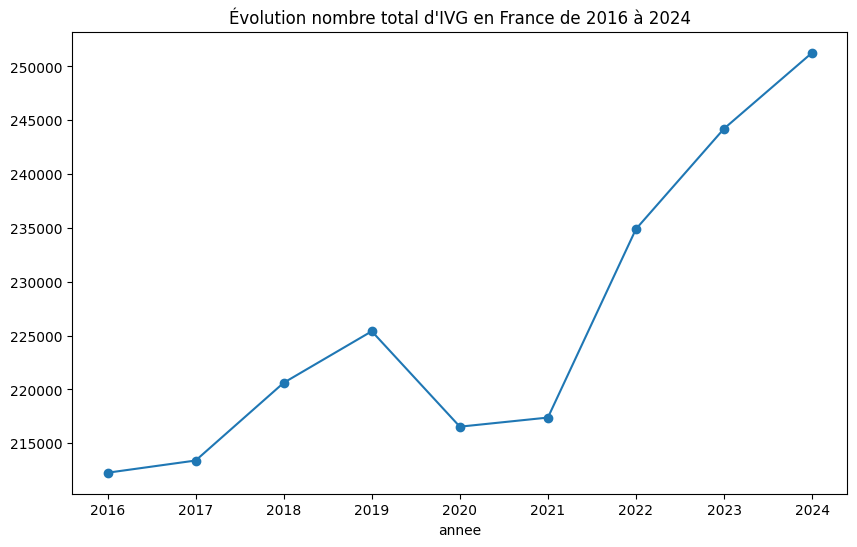

In [13]:
df_drees_filtre = df_drees[df_drees["département"] == "France entière"]
df_drees_filtre.plot(x="annee", y=["tot_ivg"], kind="line", marker='o', figsize=(10,6), title="Évolution nombre total d'IVG en France de 2016 à 2024", legend=False)
plt.show()

La hausse du nombre d’IVG depuis 2022 se poursuit, après la nette baisse en 2020 et 2021 en lien avec la pandémie de Covid-19.
Le nombre d’IVG a tendance a augmenté depuis 2017. Cette hausse est interrompu en 2020 et 2021, où le nombre d’IVG connait une chute en lien avec la pandémie de Covid-19. Depuis 2022, ce chiffre augmente de nouveau, et plus rapidement que précédemment. 

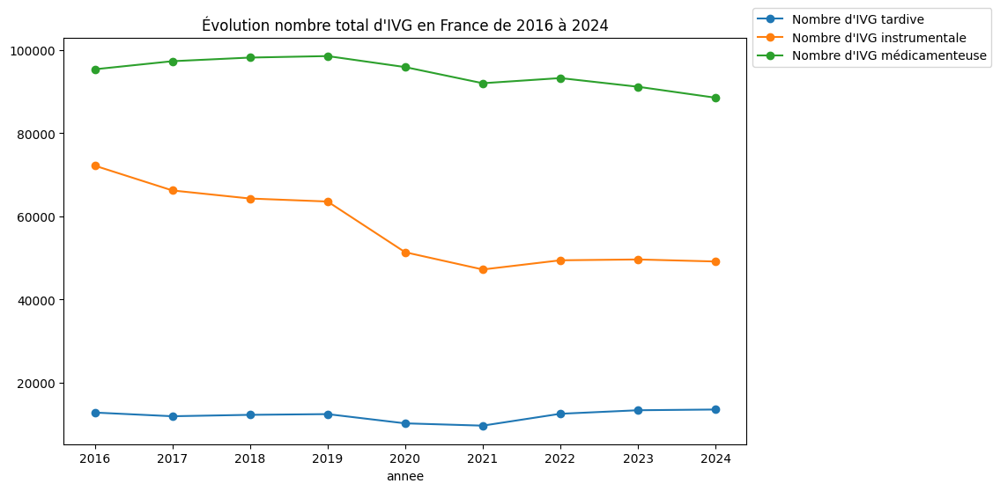

In [14]:
ax = df_drees_filtre.plot(x="annee", y=["nb_ivg_tard", "ivg_hosp_ins", "ivg_hosp_med"], kind="line", marker='o', figsize=(10,6), title="Évolution nombre total d'IVG en France de 2016 à 2024")
ax.legend(["Nombre d'IVG tardive", "Nombre d'IVG instrumentale", "Nombre d'IVG médicamenteuse"], loc="center left", bbox_to_anchor=(1, 1))
plt.show()

Le nombre d’IVG tardive suit une évolution similaire. Néanmoins, la hausse est plus faible que celle du nombre d’IVG totale entre 2023 et 2024, ce qui peut indiquer un changement des pratiques, qui suit le changement législatif de 2022. En effet, depuis 2022, il est légal de recourir à une IVG après 14 semaines de grossesse, deux semaines de plus qu’auparavant. Les IVG médicamenteuses sont plus fréquentes que les IVG instrumentales. 

### 3.2 - Échelle départementale <a name="dep"></a>

L'importance des disparités territoriales de nos variables devient claire avec nos premières cartes. Regardons par exemple la carte des possibilités de RDVs Doctolib dans moins d'un mois :

In [15]:
gdf = get_gdf(df_normalise)

gdf.explore(legend=True, scheme="quantiles", cmap="Reds", tiles="CartoDB positron", k=7, legend_kwds=dict(colorbar=True),
    column="doctolib_mois",
    tooltip=["nom", "doctolib_trimestre", "doctolib_mois", "doctolib_2sem"]
)

Certains départements comme ceux de l’Ile-de-France et le Gard ont une plus grande offre de rendez-vous médicaux pour réaliser une IVG, quelque soit le professionnel de santé. D’autres, comme la Marne ou la Vendée, ont seulement 2 établissements ou professionnels proposant un RDV dans moins d'un moi pour 100 000 femmes en âge de procréer. Ces constats révèlent des offres différenciées selon les départements, et donc des inégalités territoriales pour recourir à une IVG. 

Des analyses similaires sont possibles sur toutes nos variables, mais nous nous focalisons ici sur deux colonnes : le taux de recours à l'IVG et le nombre d'IVG effectuée hors du département de résidence de la personne. 

In [16]:
gdf.explore(legend=True, scheme="quantiles", cmap="Reds", tiles="CartoDB positron", k=7, legend_kwds=dict(colorbar=True),
    column="taux_rec",
    tooltip=["nom", "taux_rec"]
)

En comparant la disparité des taux de recours selon le département et celui de l'accessibilité sur Doctolib, nous repérons des "foyers" de départements où l'IVG est plus accessible et pratiquée. Notamment, on observe la région Sud et l'Ile-de-France. 

In [17]:
gdf.explore(legend=True, scheme="quantiles", cmap="Reds", tiles="CartoDB positron", k=7, legend_kwds=dict(colorbar=True),
    column="ivg_hors_zone",
    tooltip=["nom", "ivg_hors_zone"]
)

Les IVGs effectuées hors département de résidence semblent concerner les départements où l'accès aux IVGs est plus difficile (par exemple moins de disponibilité sur Doctolib).

### 3.3 - Corrélations entre variables <a name="corr"></a>

Afin d'approfondir l'étude, nous regardons la corrélation de nos variables à l'aide d'une matrice de corrélation. Dans un premier temps, sur les données non-normalisées :

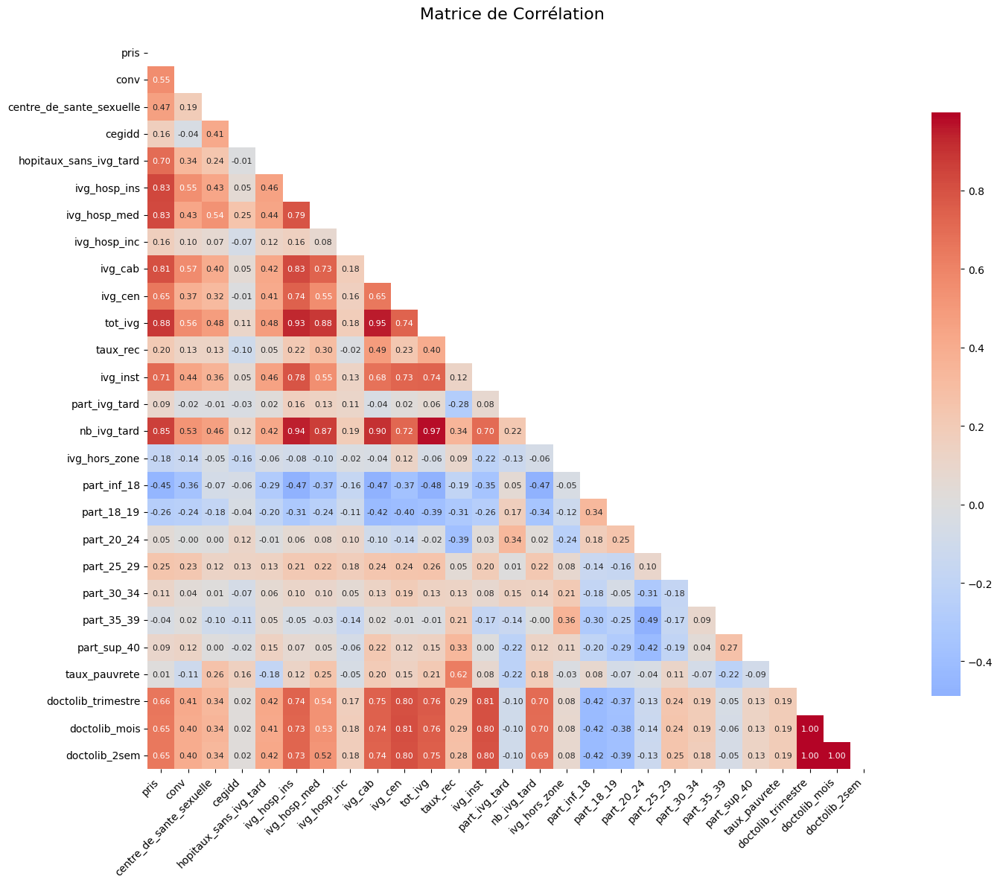

In [18]:
colonnes_numériques = [
    'pris', 'conv',
    'centre_de_sante_sexuelle', 'cegidd',
    'hopitaux_sans_ivg_tard', 'ivg_hosp_ins', 'ivg_hosp_med',
    'ivg_hosp_inc', 'ivg_cab', 'ivg_cen', 'tot_ivg', 'taux_rec', 'ivg_inst',
    'part_ivg_tard', 'nb_ivg_tard', 'ivg_hors_zone', 'part_inf_18',
    'part_18_19', 'part_20_24', 'part_25_29', 'part_30_34', 'part_35_39',
    'part_sup_40', 'taux_pauvrete', 'doctolib_trimestre', 'doctolib_mois',
    'doctolib_2sem'
]
df_model = df.fillna(0)
df_norm_model = df_normalise.fillna(0)

correlation(df_model[colonnes_numériques])

Et ensuite, sur les données normalisées :

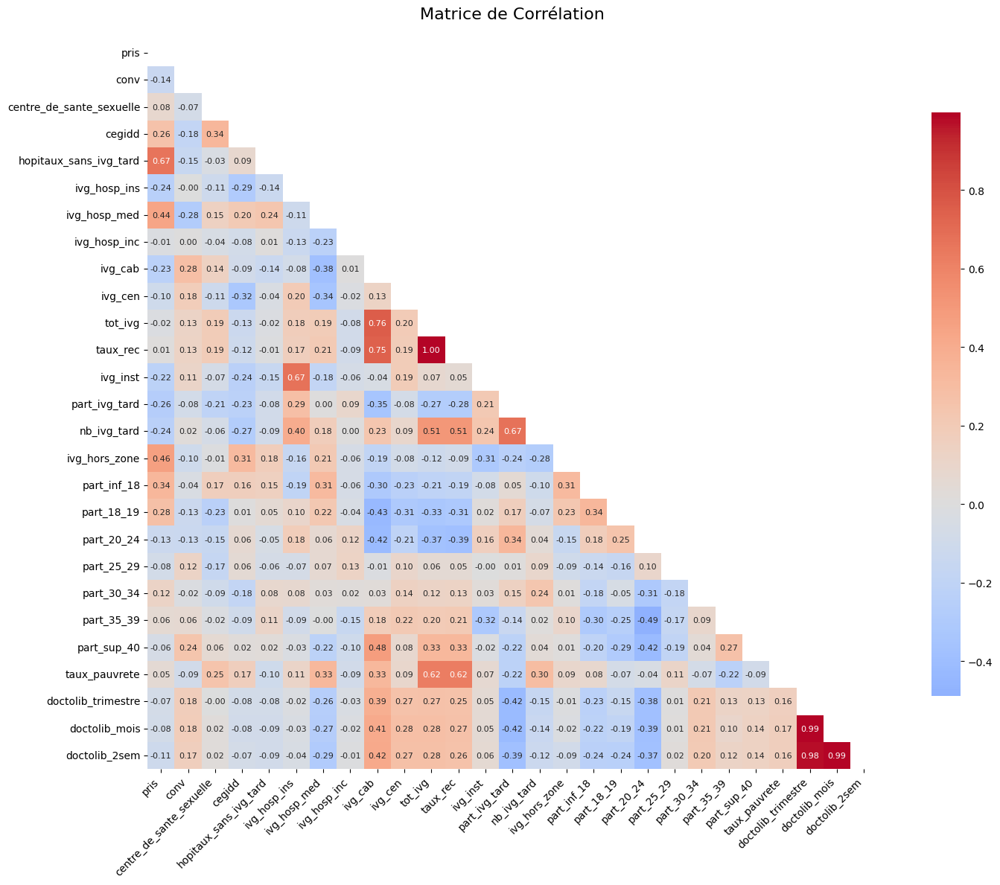

In [19]:
correlation(df_norm_model[colonnes_numériques])

La différence entre les deux matrices témoigne des effets de taille des départements. Par exemple, la corrélation entre le nombre de professionnels disponibles sous une certaine période sur Doctolib et le nombre d'IVG effectué dans un département diminue lorsqu'on normalise nos données. L'intérêt de la normalisation est ainsi de mitiger l'impact des caractéristiques des départements très peuplés sur les départements moins peuplés. 

Le taux de pauvreté est positivement corrélé avec le taux de recours à l'IVG mais pas forcément avec le niveau d'accès (Doctolib, pris, conv). L'accessibilité des IVGs ne semble pas fortement dépendre du niveau de richesse d'un département, un bon signe pour l'accès globale de l'IVG sur le territoire métropolitain. Regardons de près la régression linéaire simple de la disponibilité Doctolib dans un délai de 1 mois sur le taux de pauvreté.

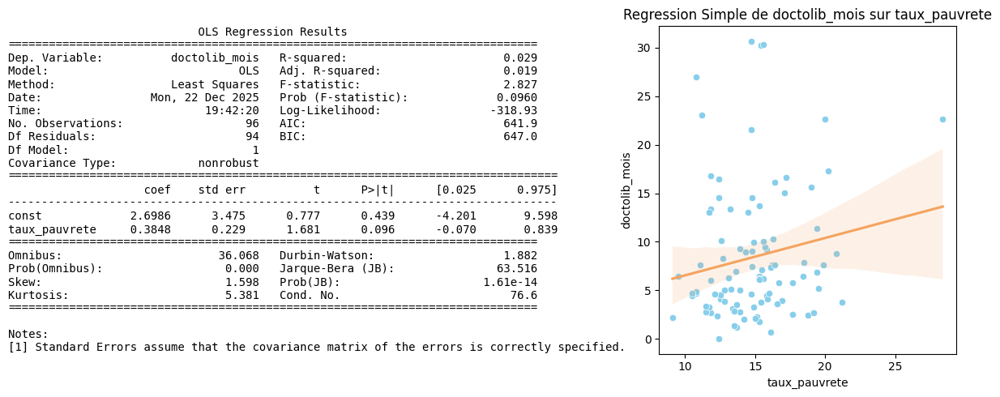

In [20]:
OLS(df_norm_model, 'taux_pauvrete', 'doctolib_mois')

Effectivement, avec un $R^2$ très faible et un coefficient de corrélation non significatif, le taux de pauvreté n'a pas d'impact statistiquement significatif sur le nombre d'établissement ou professionnels proposant des RDV IVG sous un délai d'un mois sur Docotlib.

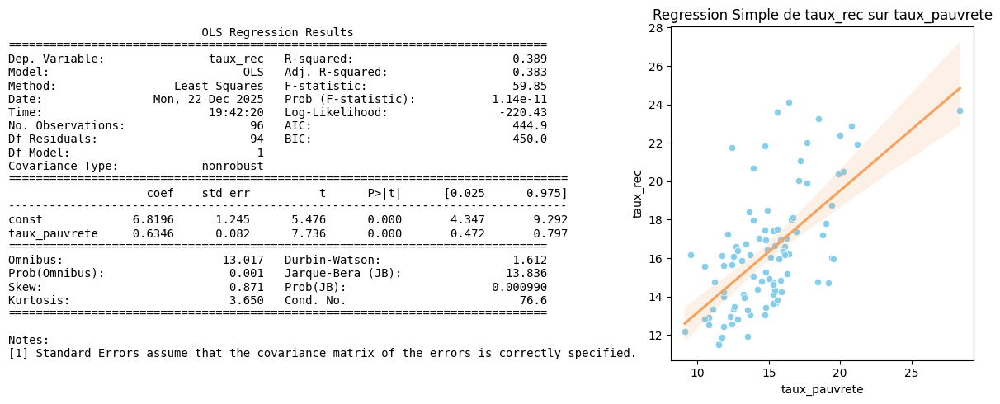

In [21]:
OLS(df_norm_model, 'taux_pauvrete', 'taux_rec')

La régression linéaire du taux de recours à l'IVG et le taux de pauvreté du département montre une relation significative et explicative entre les deux variables. Le coefficient de détermination $R^2$ nous indique que 38.9% de la variance du taux de recours peut s'expliquer par le taux de pauvreté. La p-value atteste un seuil de confiance très élevé.

## 4 - Classification des départements français <a name="classe"></a>

Afin de réaliser une typologie des départements selon le profil des pratiques d'IVG, nous réaliser une **classification ascendante hiérarchique (CAH)** avec la librairie `scipy.cluster.hierarchy`. Les variables numériques utilisées pour la CAH se trouve dans la liste ci-dessous : le taux de pauvreté n'est pas pris en compte car nous nous focalisons sur les pratiques d'IVG seulement ici.

In [22]:
colonnes_CAH = [
    'pris', 'conv', 'centre_de_sante_sexuelle', 'cegidd',
    'hopitaux_sans_ivg_tard', 'ivg_hosp_ins', 'ivg_hosp_med',
    'ivg_hosp_inc', 'ivg_cab', 'ivg_cen', 'tot_ivg', 'taux_rec', 'ivg_inst',
    'part_ivg_tard', 'nb_ivg_tard', 'ivg_hors_zone', 'age_inf_18',
    'age_18_19', 'age_20_24', 'age_25_29', 'age_30_34', 'age_35_39',
    'age_sup_40', 'doctolib_trimestre', 'doctolib_mois', 'doctolib_2sem'
]

X = df_norm_model[colonnes_CAH] 
Z = linkage(X, method="ward") # Méthode de liaison, Ward est la plus utilisée

Nous réalisons un dendrogramme afin de déterminer le nombre de classes qui nous serait pertinant.

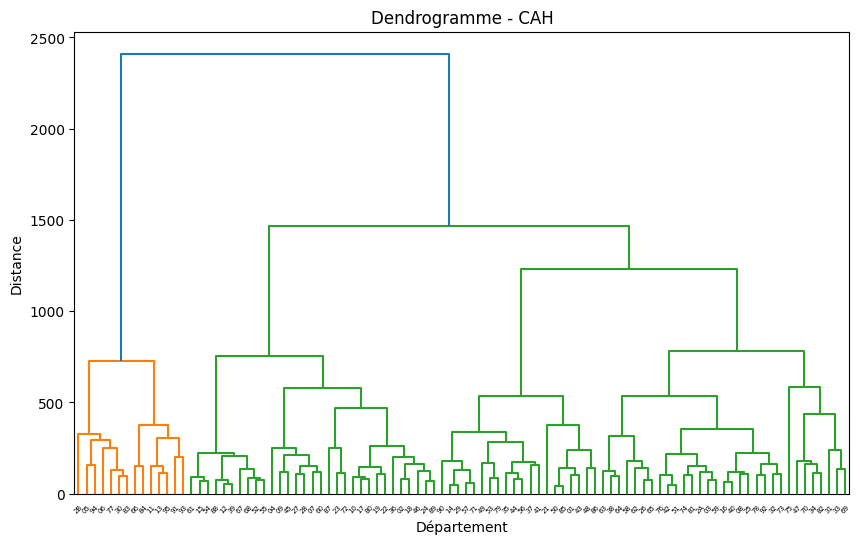

In [23]:
dendrogramme_CAH(df_norm_model, Z)

En regardant le dendrogramme, le découpage en 4 clusters semble raisonnable et la distance séparant les clusters serait d'environ 1000. `fcluster` de `scipy` est utilisé ici pour créer la colonne `cluster` qui contient le numéro de la classe assignée à chaque départment de nos données. 

In [24]:
clusters = fcluster(Z, t=4, criterion='maxclust')
df_norm_model['cluster'] = clusters
df_model['cluster'] = clusters

### 4.1 - Répartition spatiale des classes <a name="repartition"></a>

In [25]:
gdf = get_gdf(df_norm_model)
couleurs=["#003f5c","#7a5195","#ef5675","#ffa600"]
gdf.explore(
    column="cluster",
    cmap=couleurs,
    scheme="quantitative", 
    legend=True,
    tooltip=["nom", 'cluster'],
    tiles="CartoDB positron",
    k=4,                 
    categorical=True,
    legend_kwds=dict(colorbar=False),
    style_kwds={"fillOpacity": 0.9,"opacity": 1}
)

La visualisation sur une carte du résultat de la CAH permet de comprendre la répartition géographique des classes. 
- La classe 1 est concentrée sur le littoral méditérranéen et une grande partie de l'Ile-de-France, hors Paris et la banlieue Ouest parisienne. 
- La classe 2 se trouve davantage dans la diagonale des faibles densités et le Grand Est. 
- La classe 3 est particulièrement présente en Bretagne, dans le Pays de la Loire, c’est-à-dire davantage au Nord-Ouest de la France, ainsi qu’en Bourgogne-Franche-Comté. 
- La classe 4 regroupe des départements du Sud-Ouest de la France, en particulier du Sud de la région Nouvelle-Aquitaine, Paris et la banlieue Ouest, ainsi que certains départements de la région Auvergne-Rhône-Alpes et du Nord de la France. 


### 4.2 - Statistiques selon la classe <a name="statsClasse"></a>

In [26]:
colonnes_CAH_interpret = [
    'pris', 'conv',
    'centre_de_sante_sexuelle', 'cegidd',
    'hopitaux_sans_ivg_tard', 'ivg_hosp_ins', 'ivg_hosp_med',
    'ivg_hosp_inc', 'ivg_cab', 'ivg_cen', 'tot_ivg', 'taux_rec', 'ivg_inst',
    'part_ivg_tard', 'nb_ivg_tard', 'ivg_hors_zone', 'age_inf_18',
    'part_18_19', 'part_20_24', 'part_25_29', 'part_30_34', 'part_35_39',
    'part_sup_40', 'taux_pauvrete', 'doctolib_trimestre', 'doctolib_mois',
    'doctolib_2sem', 'part_ivg_tard', 'nb_ivg_tard', 'ivg_hors_zone', 'part_inf_18',
]
df_model.groupby("cluster")[colonnes_CAH_interpret].mean()

,pris,conv,centre_de_sante_sexuelle,cegidd,hopitaux_sans_ivg_tard,ivg_hosp_ins,ivg_hosp_med,ivg_hosp_inc,ivg_cab,ivg_cen,...,part_35_39,part_sup_40,taux_pauvrete,doctolib_trimestre,doctolib_mois,doctolib_2sem,part_ivg_tard,nb_ivg_tard,ivg_hors_zone,part_inf_18
cluster,,,,,,,,,,,,,,,,,,,,,
1,7.785714,22.714286,5.500000,0.642857,1.857143,841.142857,1501.357143,20.428571,2323.357143,244.500000,...,0.174176,0.079803,18.350000,61.642857,56.714286,47.357143,4.800000,251.142857,18.192857,0.027443
2,4.129032,4.903226,2.483871,1.258065,1.290323,216.387097,735.903226,4.451613,272.258065,28.806452,...,0.168615,0.068764,14.932258,9.516129,8.451613,6.483871,5.203226,69.129032,20.664516,0.034243
3,4.800000,11.650000,2.250000,0.950000,1.300000,461.800000,656.200000,25.450000,425.800000,49.600000,...,0.164781,0.069956,12.425000,19.800000,17.200000,14.750000,5.980000,99.250000,16.070000,0.034262
4,6.645161,23.838710,4.451613,1.774194,1.870968,634.806452,878.870968,9.612903,1317.774194,200.612903,...,0.165510,0.076890,14.841935,42.580645,39.064516,32.870968,5.096774,157.548387,14.712903,0.030142


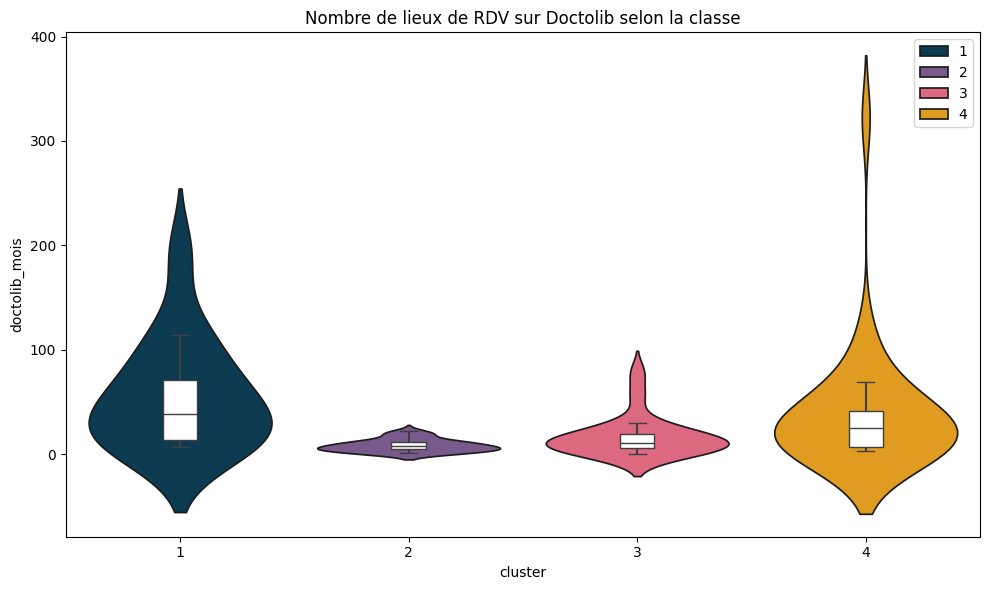

In [27]:
violon(df_model, 'cluster', 'doctolib_mois', couleurs, 'Nombre de lieux de RDV sur Doctolib selon la classe')

In [28]:
displot(df_norm_model)

NameError: name 'colonnes_CAH_interpret' is not defined

Les classes de la CAH permettent de réaliser une typologie des départements selon leur profil type d’accès aux différents types d’IVG. Les classes 1 et 2 se distinguent spécifiquement, alors que les classes 3 et 4 apparaissent comme des profils intermédiaires entre les deux premiers. 

Même si le nombre standardisé de centres prenant en charge les IVG sont similaires,  cela ne témoigne pas d’un accès homogène aux IVG selon les classes, comme le témoigne les différences des distributions du nombre de conventions avec médecins de ville pour IVG médicamenteuses (conv) et les indice d’accès doctolib. 

La classe 1 se caractérise par un fort nombre de CSS et de médecins conventionnés ainsi qu’un nombre important d’IVG réalisés en centres et en cabinet, mais un faible nombre de CEGIDD. Les IVG tardives sont également prises en charge avec un faible nombre d'hôpitaux qui ne les réalisent pas. Ainsi, les recours à des IVG médicamenteuses ou instrumentales sont assez aisées dans ces départements où l’accessibilité des rendez-vous est forte sur les 3 périodes de temps étudiées. Seulement 5% des résidentes de ces départements ont recours à une IVG en dehors de leur département de résidence. 

La classe 2 se caractérise d’une manière opposée avec un faible nombre de CSS et un nombre important de CEGIDD, donc un nombre plus faible d’IVG réalisé en centres. Les IVG tardives sont très peu prises en charge, avec plus d'hôpitaux que dans les autres classes qui ne réalisent pas ces IVG. L’accessibilité des IVG est également très limitée sur doctolib. La part des IVG tardives parmi l’ensemble des IVG pratiquées est relativement plus faible que dans les autres classes, et la part d’IVG médicamenteuse est bien plus importante que dans les autres classes. Ainsi, les IVG instrumentales sont très peu accessibles dans ces départements, ce qui explique que le taux de recours dans un autre département que celui de résidence s’élève à 22% dans les départements de la classe 2. 

La classe 3 présente peu de CEGIDD en moyenne, et un nombre assez faible d’hopitaux qui ne prennent pas en charge les IVG tardives. Les disponibilités de rendez-vous sur doctolib sont plus faibles que la classe 1 et 2, mais plus importantes que la classe 3, représentant ainsi une situation intermédiaire. Ce qui est cohérent avec un taux de recours à une IVG hors du département de résidence plus élevé en moyenne dans ces départements (15%) que dans la classe 4 (9%). 

En effet, la classe 4 se caractérise par la seconde plus forte accessibilité des IVG après la classe 1, mais une moindre dotation en infrastructures telles que les CSS et les CEGIDD. Les IVG pratiquées dans ces départements sont plus souvent des IVG instrumentales, et moins souvent médicamenteuses. Mais, cela ces IVG instrumentales ne sont pas davantage faites tardivement. Cela témoigne d’une prise en charge particulière des IVG, avec un recours plus grand à celle instrumentale et moins celle médicamenteuse effectuée en CSS ou en cabinet.  


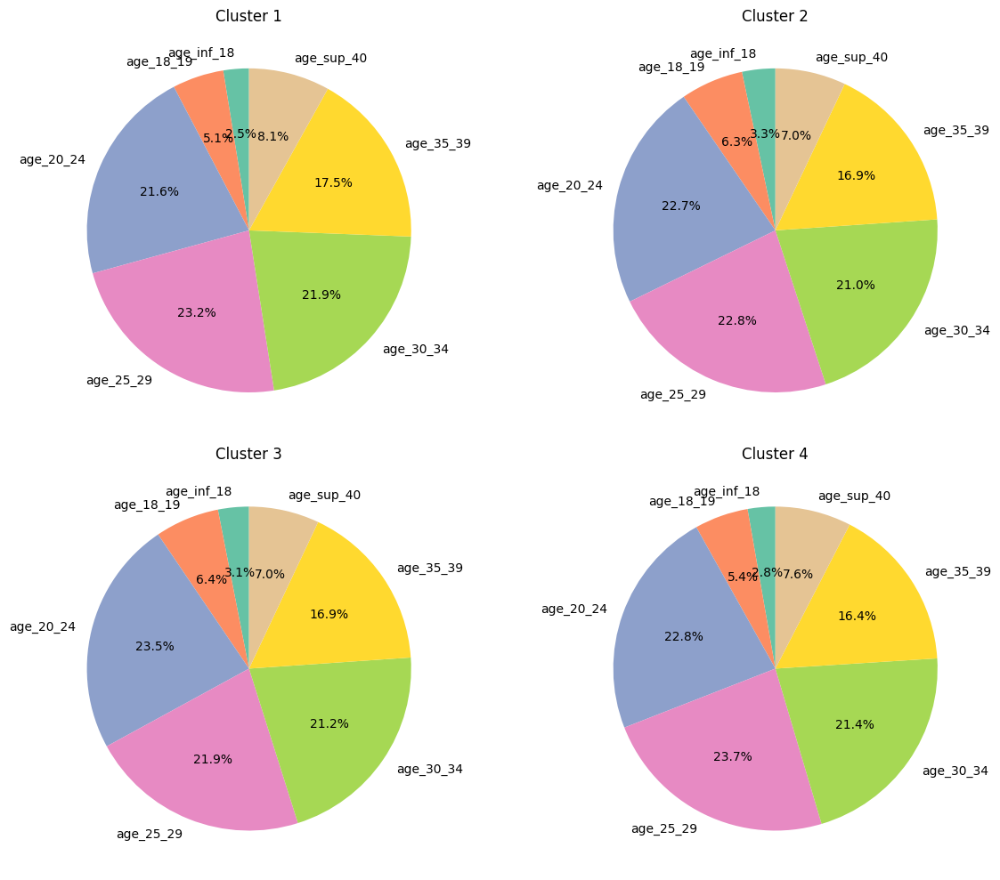

In [ ]:
camembert_cluster(df_model)

La répartition par âge des personnes ayant recours à des IVG est similaire. Cela témoigne d’une absence de spécificités par classe concernant cette variable. 

### 4.3 - Lien avec le taux de pauvreté <a name="lienPauv"></a>

Analysons les distributions des taux de pauvreté dans chaque classe de la CAH, sachant que le taux de pauvreté n’a pas servi à construire la typologie, néanmoins elle permet de cerner le profil socio-économique des départements de chaque classe.  

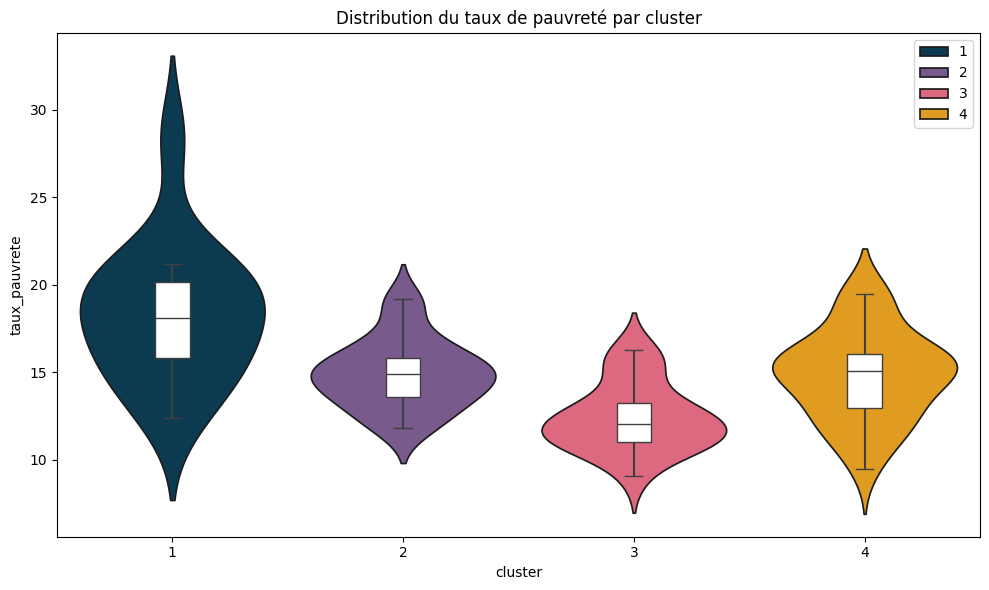

In [ ]:
violon(df_model, 'cluster', 'taux_pauvrete', couleurs, 'Distribution du taux de pauvreté par cluster')

Les départements de la classe 1 présentent des taux de pauvreté supérieurs aux autres classes, en médiane et en moyenne (cf tableau de moyenne), alors que la classe 3 concentre les départements avec les taux de pauvreté le plus bas, avec une distribution particulièrement concentrée autour de la médiane. 

Si les classes 3 et 4 apparaissent proches en termes de caractéristiques portant sur les IVG, elles se distinguent par leur taux de pauvreté, plus important en médiane dans la classe 4. En effet, au moins la moitié des départements a un taux de pauvreté supérieur à 16%, alors que c’est 12,5% pour la classe 3. La classe 2 présente des similarités avec la classe 4. Néanmoins, sa distribution est moins étendue, ce qui témoigne d’une plus grande homogénéité entre les départements de la classe 2 que ceux de la classe 4. 

Ainsi, nous voyons un effet particulier du taux de pauvreté sur l’accessibilité aux IVG et sur le profil IVG des départements. En effet, dans la classe 1, les IVG sont nombreuses, davantage accessibles, et le département est plus pauvre que les autres. Au contraire, la classe 2 avec la moindre accessibilité aux IVG à un taux de pauvreté médian de 15% ce qui est inférieur à celui de la classe 1 et supérieur à celui de la classe 3. Cette classe regroupe les départements de la diagonale des faibles densités, variable qui peut être expliquée une plus faible présence d’infrastructures et un taux de pauvreté plus haut que la classe 3. 

En moyenne, les classes 1 et 2 ont un taux de pauvreté inférieur à celui des classes 3 et 4. 
La classe 1 se caractérise par un nombre plus important en moyenne d'IVG, une accessibilité et disponibilité plus forte, à la fois en termes d'infrastructures et de rendez-vous disponibles, ainsi qu'un taux de pauvreté plus important. Ce sont davantage des mineurs qui y avortent, et les personnes changent moins souvent de départements pour avorter que dans les autres départements. Ce que confirme le taux de recours plus haut que les autres. 

Cela témoigne des inégalités d’accès aux IVG en fonction du département, où le taux de pauvreté peut également être le reflet de l’importance de la prise en charge des IVG comme dans la classe 1).


### 4.4 - Prédiction de la classe avec le taux de pauvreté <a name="logit"></a>
Afin d’expliquer la probabilité pour un département de faire partie d’une de ces 4 classes en fonction de son taux de pauvreté, nous utilisons un modèle de régression logistique. Nous créons une variable binaire, où 1 représente l’appartenance à la classe 1 et 0 l’appartenance à une autre classe. Le but est d’évaluer l’effet du taux de pauvreté sur la probabilité de faire partie de la classe 1 plutôt qu’une autre, sans variable de contrôle ici (car presque toutes les variables participent à construire la CAH). 

Pour présenter les résultats de la régression logistique, nous avons choisi d’analyser l’effet marginal moyen du taux de pauvreté sur la probabilité étudiée. L'effet marginal moyen indique la variation de la probabilité d’être de la classe 1, selon le taux de pauvreté. 
Nous avons réalisé ce même modèle pour les probabilités d’appartenir à la classe 2, 3 et 4 et pas aux autres. 

In [ ]:
marginal_effect = regression_logistique(df_model, 1)
marginal_effect.summary_frame().reset_index()

Optimization terminated successfully.
         Current function value: 0.306070
         Iterations 7


,index,dy/dx,Std. Err.,z,Pr(>|z|),Conf. Int. Low,Cont. Int. Hi.
0,taux_pauvrete,0.04636,0.010161,4.562615,0.000005,0.026445,0.066275


L’effet marginal indique qu’une augmentation d’une unité du taux de pauvreté est associée à une variation moyenne de 0,046 de la probabilité de l’événement. En d’autres termes, une augmentation d’un point du taux de pauvreté est associée à une hausse moyenne de 4,6 points de pourcentage de la probabilité d’appartenir à la classe 1 plutôt qu’une autre. Cet effet est positif et statistiquement significatif au seuil de 1 %. C’est-à-dire que plus un département est pauvre, plus il y a de chance qu’il fasse partie de la classe 1, où les IVG sont nombreuses et l’accès aisé. 

## Conclusion <a name="ccl"></a>

En France, les données publiques et open sources sur les IVGs en France manquent. Par exemple, les délais de recours sont absents des deux plus importantes sources de données sur les IVGs : la base DREES et de la base SAE (colonne incomplète avant 2014, puis retirée). Ainsi, le web-scrapping de la platforme Doctolib permet le pallier à ce manque de données et fourni un indicateur des délais d'accès aux IVGs fiable à cause de leur position dominante sur le marché.

Les données récoltées témoignent d'un accès différencié sur le territoire aux IVGs. Les personnes dans les départements avec un accès aux soins plus difficile se déplacent vers des départements où l'IVG est plus accessible. Cependant, les causes de cette fragmentation du territoire ne sont pas facilement discernables avec ce projet. Les différents indicateurs ne sont pas forcéments corrélés fortement : une causalité entre accessibilité et recours aux soins n'est pas présente, ni entre accès aux IVGs et taux de pauvreté. 

Malgré ce constat, une première description des inégalités d’accès est possible grâce à la classification des départements selon leur pratiques d'IVG. Cette fragmentation du territoire se remarque selon l'accessibilité aux soins, les taux de recours aux IVGs, et le profil de l'âge des femmes de 15 à 49 ans. Grâce à cette classification, il est tout de même possible de voir que le taux de pauvreté augmente les probabilités d'un département d'avoir un accès aisé et un recours élevé aux IVGs.